In [1]:
!pip install pandas matplotlib seaborn scikit-learn xgboost

In [2]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LinearRegression
from sklearn.ensemble import RandomForestRegressor, GradientBoostingRegressor, VotingRegressor
from xgboost import XGBRegressor
from sklearn.metrics import r2_score, mean_squared_error

In [3]:
df = pd.read_csv("/content/GlobalWeatherRepository.csv")  # Change to your file path

In [4]:
print(df.describe())
print("Missing values:\n", df.isnull().sum())

           latitude     longitude  last_updated_epoch  temperature_celsius  \
count  88273.000000  88273.000000        8.827300e+04         88273.000000   
mean      19.125848     22.172647        1.735507e+09            22.681788   
std       24.470798     65.836668        1.135389e+07             9.091355   
min      -41.300000   -175.200000        1.715849e+09           -24.900000   
25%        3.750000     -6.836100        1.725710e+09            18.000000   
50%       17.250000     23.316700        1.735555e+09            25.000000   
75%       40.400000     50.580000        1.745313e+09            28.400000   
max       64.150000    179.220000        1.755074e+09            49.200000   

       temperature_fahrenheit      wind_mph      wind_kph   wind_degree  \
count            88273.000000  88273.000000  88273.000000  88273.000000   
mean                72.828923      8.292613     13.348916    170.584743   
std                 16.364215      8.137603     13.093950    103.107058 

In [ ]:
sns.pairplot(df.select_dtypes(include=['float64', 'int64']))
plt.show()

Number of anomalies detected: 510
          country location_name  latitude  longitude          timezone  \
29013  Kazakhstan        Astana   51.1811    71.4278       Asia/Almaty   
29040    Mongolia   Ulaanbaatar   47.9167   106.9167  Asia/Ulaanbaatar   
29820    Mongolia   Ulaanbaatar   47.9167   106.9167  Asia/Ulaanbaatar   
30015    Mongolia   Ulaanbaatar   47.9167   106.9167  Asia/Ulaanbaatar   
30405    Mongolia   Ulaanbaatar   47.9167   106.9167  Asia/Ulaanbaatar   
...           ...           ...       ...        ...               ...   
62200      Canada        Ottawa   45.4167   -75.7000   America/Toronto   
63158     Belarus         Minsk   53.9000    27.5667      Europe/Minsk   
63565      Canada        Ottawa   45.4167   -75.7000   America/Toronto   
63743     Belarus         Minsk   53.9000    27.5667      Europe/Minsk   
64037    Mongolia   Ulaanbaatar   47.9167   106.9167  Asia/Ulaanbaatar   

       last_updated_epoch      last_updated  temperature_celsius  \
29013    

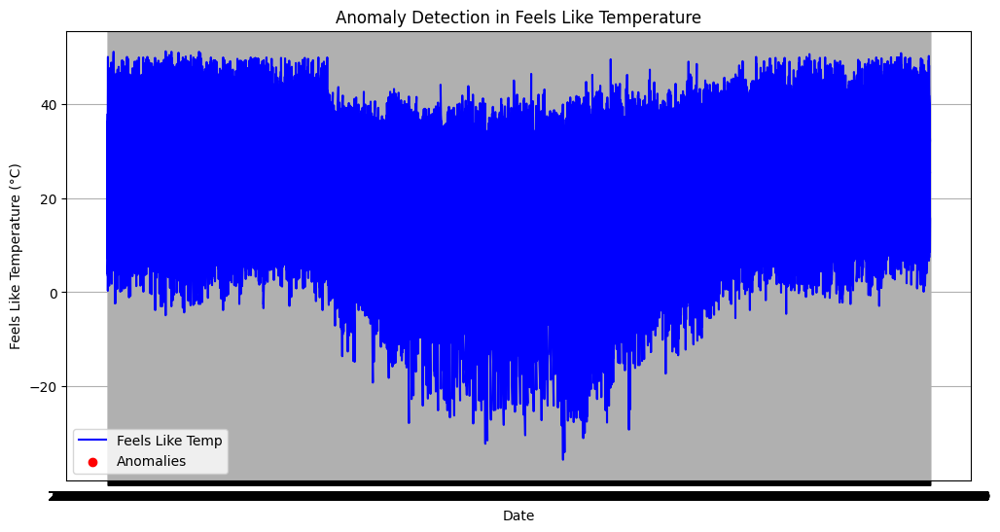

In [ ]:
import numpy as np

# Example: Detect anomalies in 'feels_like_celsius'
z_scores = np.abs((df['feels_like_celsius'] - df['feels_like_celsius'].mean()) / df['feels_like_celsius'].std())

# Define threshold (e.g., 3 standard deviations from the mean)
threshold = 3
anomalies = df[z_scores > threshold]

print(f"Number of anomalies detected: {len(anomalies)}")
print(anomalies)

# Optional: Visualize anomalies
plt.figure(figsize=(12,6), dpi=100)
plt.plot(df['last_updated'], df['feels_like_celsius'], label='Feels Like Temp', color='blue')
plt.scatter(anomalies['last_updated'], anomalies['feels_like_celsius'], color='red', label='Anomalies')
plt.title("Anomaly Detection in Feels Like Temperature", fontsize=12)
plt.xlabel("Date", fontsize=10)
plt.ylabel("Feels Like Temperature (°C)", fontsize=10)
plt.legend()
plt.grid(True)
plt.show()


In [ ]:
# Convert date column to datetime
df['last_updated'] = pd.to_datetime(df['last_updated'])

# Target & Features
target_column = 'feels_like_celsius'
X = df.drop(columns=[target_column, 'last_updated'])  # Drop target + date
y = df[target_column]

from sklearn.preprocessing import LabelEncoder

categorical_cols = X.select_dtypes(include=['object']).columns
for col in categorical_cols:
    X[col] = LabelEncoder().fit_transform(X[col])

# Chronological train-test split
train_size = int(len(df) * 0.8)
X_train, X_test = X.iloc[:train_size], X.iloc[train_size:]
y_train, y_test = y.iloc[:train_size], y.iloc[train_size:]

In [ ]:
from sklearn.metrics import mean_absolute_error, mean_squared_error, r2_score

# Define models
models = {
    "Linear Regression": LinearRegression(),
    "Random Forest": RandomForestRegressor(n_estimators=100, random_state=42),
    "Gradient Boosting": GradientBoostingRegressor(random_state=42),
    "XGBoost": XGBRegressor(n_estimators=100, random_state=42)
}

# Train & Evaluate models
results = []
for name, model in models.items():
    model.fit(X_train, y_train)
    preds = model.predict(X_test)

    mae = mean_absolute_error(y_test, preds)
    rmse = np.sqrt(mean_squared_error(y_test, preds))
    r2 = r2_score(y_test, preds)

    results.append({"Model": name, "MAE": mae, "RMSE": rmse, "R²": r2})

# Convert results to DataFrame
results_df = pd.DataFrame(results).sort_values(by="RMSE")
print(results_df)

               Model       MAE      RMSE        R²
1      Random Forest  0.017467  0.029707  0.999988
0  Linear Regression  0.026294  0.031821  0.999986
2  Gradient Boosting  0.073248  0.096909  0.999869
3            XGBoost  0.063056  0.147150  0.999698


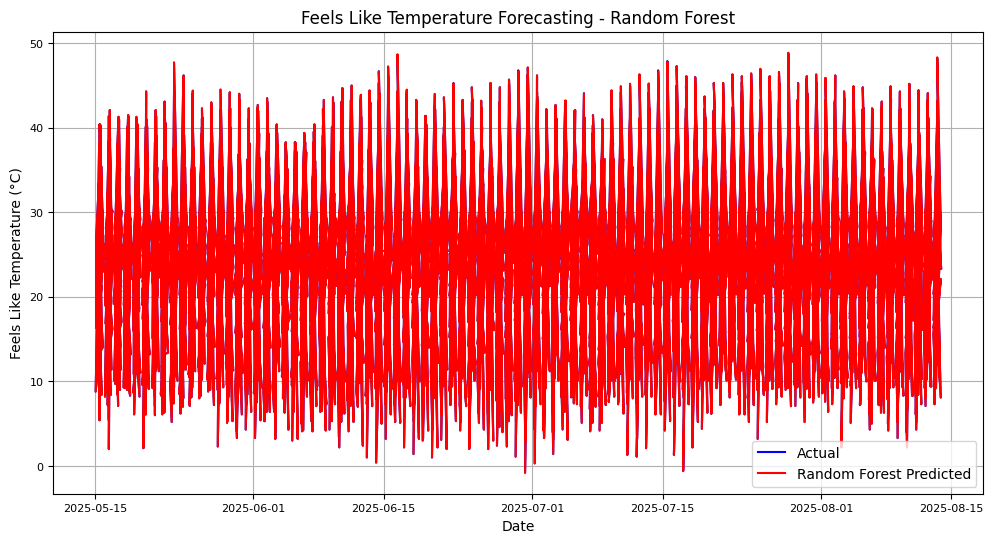

In [ ]:
best_model_name = results_df.iloc[0]['Model']
best_model = models[best_model_name]
best_preds = best_model.predict(X_test)

plt.figure(figsize=(12, 6))
plt.plot(df['last_updated'].iloc[train_size:], y_test, label='Actual', color='blue')
plt.plot(df['last_updated'].iloc[train_size:], best_preds, label=f'{best_model_name} Predicted', color='red')
plt.title(f"Feels Like Temperature Forecasting - {best_model_name}", fontsize=12)
plt.xlabel("Date", fontsize=10)
plt.ylabel("Feels Like Temperature (°C)", fontsize=10)
plt.tick_params(axis='x', labelsize=8)
plt.tick_params(axis='y', labelsize=8)
plt.legend()
plt.grid(True)
plt.show()

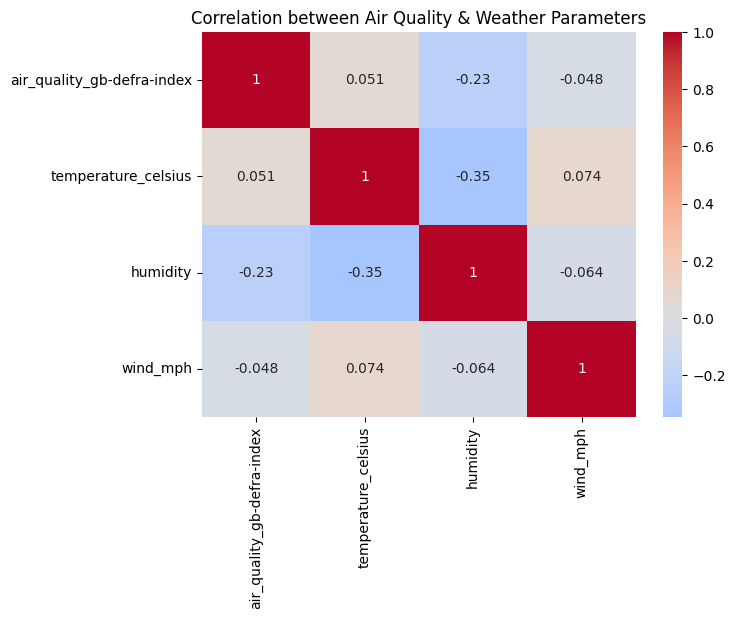

In [6]:
import seaborn as sns

# Correlation between air quality and weather features
corr = df[['air_quality_gb-defra-index', 'temperature_celsius', 'humidity', 'wind_mph']].corr()

plt.figure(figsize=(7,5))
sns.heatmap(corr, annot=True, cmap="coolwarm", center=0)
plt.title("Correlation between Air Quality & Weather Parameters")
plt.show()


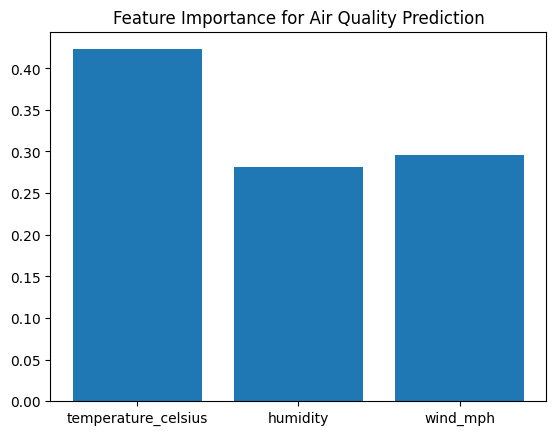

In [7]:
from sklearn.ensemble import RandomForestRegressor
from sklearn.model_selection import train_test_split

# Example target: air quality prediction
X = df[['temperature_celsius', 'humidity', 'wind_mph']]
y = df['air_quality_gb-defra-index']

# Train-test split
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Random Forest feature importance
model = RandomForestRegressor(random_state=42)
model.fit(X_train, y_train)

importances = model.feature_importances_

# Visualize
plt.bar(X.columns, importances)
plt.title("Feature Importance for Air Quality Prediction")
plt.show()
